In [1]:
#conda install -c bioconda simba_pbg -y
#pip install simba muon torch Jvis-learn
#sudo apt-get install bedtools
#conda install -c conda-forge cupy -y
#pip install --trusted-host pypi.org --trusted-host pypi.python.org --trusted-host files.pythonhosted.org dask==2021.4.0

In [2]:
import Jvis
import muon as mu
import simba as si
import scanpy as sc
import stream2 as st2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import preprocessing
import os
import pickle
import hvplot.pandas

/home/jo/anaconda3/envs/stream2/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Download data, preprocess

In [ ]:
### Download data
dict_adata = si.datasets.multiome_ma2020_fig4()
adata_CP = dict_adata['atac']
adata_CG = dict_adata['rna']

### ATAC

si.pp.filter_peaks(adata_CP,min_n_cells=3)
si.pp.cal_qc_atac(adata_CP)
si.pl.violin(adata_CP,list_obs=['n_counts','n_peaks','pct_peaks'], list_var=['n_cells'])
si.pl.hist(adata_CP,list_obs=['n_counts','n_peaks','pct_peaks'], log=True, list_var=['n_cells'])

#select peaks (optional)
#It will speed up the trainning process by only keeping peaks associated with top PCs:
si.pp.pca(adata_CP, n_components=50)
si.pl.pca_variance_ratio(adata_CP)
si.pp.select_pcs_features(adata_CP)

### RNA

si.pp.filter_genes(adata_CG,min_n_cells=3)
si.pp.cal_qc_rna(adata_CG)
si.pp.normalize(adata_CG,method='lib_size')
si.pp.log_transform(adata_CG)

#Optionally, variable gene selection step can be also performed.

si.pp.select_variable_genes(adata_CG)
si.pl.variable_genes(adata_CG,show_texts=True)
si.pp.pca(adata_CG,n_components=50,feature='highly_variable')


adata_CG.write('adata_CG.h5ad')
adata_CP.write('adata_CP.h5ad')

# Motifs from original paper

In [ ]:
def anndata2file(adata, outdir):
    import scipy
    import fast_matrix_market as fmm

    isExist = os.path.exists(outdir)
    if not isExist:
        os.makedirs(outdir)
        print(outdir, " is created!")

    # Save region
    region = adata.var[["seqnames", "start", "end"]]
    region.to_csv(
        outdir + "/region_file.bed", sep="\t", header=None, index=None
    )

    # Save sample
    sample = pd.DataFrame(adata.obs.index.tolist())
    sample.to_csv(outdir + "/sample_file.tsv", header=None, index=None)

    # Save count
    count = adata.X.T
    count = scipy.sparse.coo_matrix(count)
    fmm.mmwrite(outdir + "/count_file.mtx", count)
    
adata_CP.var['seqnames']=adata_CP.var['chr']
anndata2file(adata_CP,'result_simba/')
!Rscript stream2_chromVar_shareseq.R
adata_CM = sc.AnnData(pd.read_csv('result_simba/zscores.tsv.gz',sep='\t',header=0,index_col=0).T)
adata_CM.write('adata_CM.h5ad')

# Other ways to get motif matrix 

In [ ]:
### using pychromvar

#import pychromvar as pc
#from pyjaspar import jaspardb
#print('download genome')
#pc.get_genome("mm10", output_dir="./")
#print('add_peak_seq')
#pc.add_peak_seq(adata_CP, genome_file="./mm10.fa", delimiter="_")
#print('add_gc_bias')
#pc.add_gc_bias(adata_CP)
#print('get_bg_peaks')
#pc.get_bg_peaks(adata_CP)
#
## get motifs
#jdb_obj = jaspardb(release='JASPAR2022')
#motifs = jdb_obj.fetch_motifs(collection = None, species=10090)
#
#print('match_motif')
#pc.match_motif(adata_CP, motifs=motifs)
#print('compute_deviations')
#dev = pc.compute_deviations(adata_CP,n_jobs=1)
#adata_motif = dev
#adata_motif.raw = dev

In [ ]:
### using simba

#si.write_bed(adata_CP, use_top_pcs=False)
#!wget https://hgdownload.soe.ucsc.edu/goldenPath/mm10/bigZips/mm10.fa.gz
#!gunzip -f mm10.fa.gz
#!wget https://raw.githubusercontent.com/pinellolab/simba/master/R_scripts/scan_for_kmers_motifs.R
#!mamba install r-essentials r-optparse bioconductor-jaspar2020 bioconductor-biostrings bioconductor-tfbstools bioconductor-motifmatchr bioconductor-summarizedexperiment r-doparallel bioconductor-rhdf5 bioconductor-hdf5array -y
#!mamba install -c bioconda bedtools -y
#!Rscript scan_for_kmers_motifs.R -i result_simba/peaks.bed -g mm10.fa -s 'Mus musculus'

#pip install fast_matrix_market
#import fast_matrix_market as fmm
#adata_PM = sc.AnnData(fmm.mmread('output_kmers_motifs/matrix.mtx').tocsr())
#adata_PM.var_names=pd.read_csv('output_kmers_motifs/motifs.tsv',sep='\t',header=None)[0].map(lambda t:t[0])
#adata_PM.obs_names=pd.read_csv('output_kmers_motifs/peaks.tsv',sep='\t',header=None)[0].map(lambda t:t[0])
#adata_PM.write('adata_PM.h5ad')

# Gene score

In [ ]:
## using simba
#adata_CG_atac=si.tl.gene_scores(adata_CP,'mm10')
#adata_CG_atac.write('adata_CG_atac.h5ad')

In [ ]:
## using episcanpy
#import episcanpy as esc
#import pandas as pd
#import gtfparse
#
#adata_CP.var_names = adata_CP.var_names.map(lambda s: s.replace(':','_').replace('-','_'))
#esc.tl.geneactivity(adata_CP,'Mus_musculus.GRCm39.107.gtf.gz',annotation='ensembl')

# Create MuData object, joint embedding

In [3]:
adata_CG = sc.read('../data/shareseq/adata_CG.h5ad')
adata_CP = sc.read('../data/shareseq/adata_CP.h5ad')
adata_CG_atac = sc.read('../data/shareseq/adata_CG_atac.h5ad')
adata_CM = sc.read('../data/shareseq/adata_CM.h5ad')

In [4]:
### full mdata

data = {'rna': adata_CG, 'atac': adata_CP, 'motif':adata_CM,'atac_gs':adata_CG_atac} 
data_pca = {'rna': adata_CG.obsm['X_pca'], 'atac': adata_CP.obsm['X_pca']}
mdata = mu.MuData(data)
mdata.obs['celltype']=mdata['rna'].obs['celltype']
mdata.obsm['X_jumap'] = Jvis.JUMAP(metric='cosine',n_neighbors=15,a=10,b=.5,random_state=0).fit_transform(data_pca)
#mdata['rna'].layers['X_imputed'] = sc.external.pp.magic(mdata['rna'],name_list='all_genes',solver='approximate',n_jobs=8,random_state=0,verbose=1,copy=1).X

### mdata with motifs only
motif_gene = []
for l in mdata['motif'].var_names.str.split('_'):
    #extract entry after LINE+number
    motif_gene.append(l[np.where(['LINE' in s for s in l])[0][0]+1])
motif_gene = np.array(motif_gene)

# filter to motif names also present in RNA
gene2motifs = {}
for gene in mdata['rna'].var_names:
    idx = np.where(motif_gene==gene)[0]
    if len(idx):
        gene2motifs[gene] = list(mdata['motif'].var_names[idx])
print(mdata['motif'].shape[1]-len(gene2motifs),"missing motifs")
gene2motifs = pd.Series(gene2motifs).explode()

data_motif = {'rna':  mdata['rna'][:,mdata['rna'].var_names.isin(gene2motifs.index)].copy(), 
              #'atac_gs':mdata['atac_gs'][:,mdata['atac_gs'].var_names.isin(gene2motifs.index)].copy(),
              'motif': mdata['motif'][:,gene2motifs].copy(),
             }
mdata_motif = mu.MuData(data_motif)
mdata_motif.obs = mdata.obs
mdata_motif.obsm = mdata.obsm
mdata_motif.uns = mdata.uns
#mdata_motif['rna'].layers['X']=mdata_motif['rna'].X
#mdata_motif['rna'].X = mdata_motif['rna'].layers['X_imputed']

/home/jo/anaconda3/envs/stream2/lib/python3.8/site-packages/mudata/_core/mudata.py:457: UserWarning: Cannot join columns with the same name because var_names are intersecting.
  warnings.warn(


344 missing motifs


# Trajectory inference

Seeding initial graph...
Clustering...
K-Means clustering ...
Calculating minimum spanning tree...


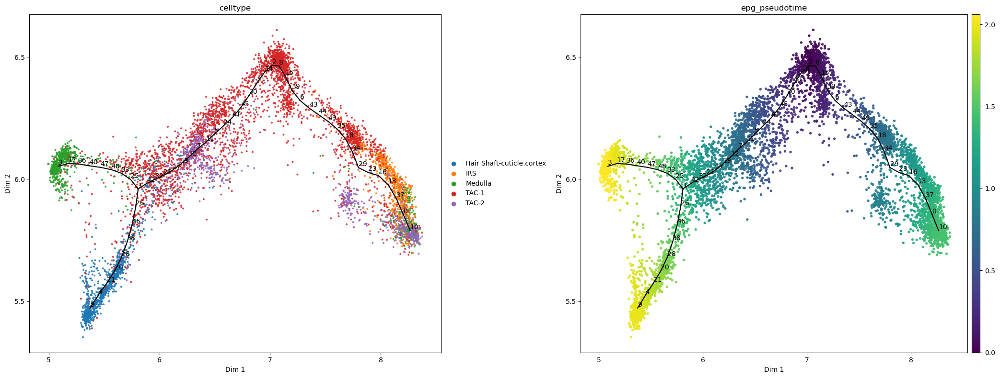

In [5]:
mdata_motif.obsm['X_dr'] = mdata_motif.obsm['X_jumap'] 
st2.tl.seed_graph(mdata_motif,n_clusters=20)
st2.tl.learn_graph(mdata_motif)

source, target = 2, 9
st2.tl.infer_pseudotime(mdata_motif,source=source)
st2.pl.graph(mdata_motif,color=['celltype','epg_pseudotime'],show_text=1,fig_size=(10,8))

/home/jo/anaconda3/envs/stream2/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/tmp/ipykernel_3837/1336335901.py:24: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for lh in ax.get_legend().legendHandles:


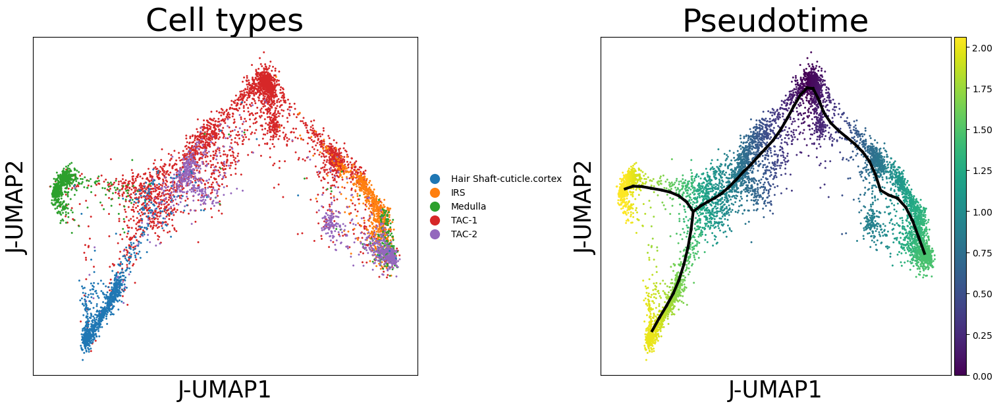

In [6]:
f,axs=plt.subplots(1,2,figsize=(15,6))

annot=['celltype','epg_pseudotime',]
annot_name=['Cell types','Pseudotime',]

nodep=mdata_motif.uns['epg']['node_pos']
edges=mdata_motif.uns['epg']['edge']

mdata_motif.obsm['X_umap']=mdata_motif.obsm['X_jumap']
for i,key in enumerate(annot):
    ax=axs[i]
    if i==1:
        ax=sc.pl.umap(mdata_motif,color=key,cmap='viridis',ax=ax,show=False)
        for e in edges:
            ax.plot(*nodep[e].T,linewidth=3,color='k')
    else:
        ax=sc.pl.umap(mdata_motif,color=key,ax=ax,show=False)
        
    ax.set_title(annot_name[i],fontsize=35)
    ax.set_xlabel('J-UMAP1',fontsize=25)
    ax.set_ylabel('J-UMAP2',fontsize=25)
    if i!=1:
        #ax.legend(prop=dict(size=18),bbox_to_anchor=[1.2, 0.5], loc='center')
        for lh in ax.get_legend().legendHandles: 
            lh._sizes = [100] 

plt.tight_layout(pad=0,w_pad=1)
plt.savefig(f'figures/shareseq/shareseq_jumap.png',dpi=300,bbox_inches='tight')
plt.savefig(f'figures/shareseq/shareseq_jumap.pdf',dpi=300,bbox_inches='tight')
plt.show()

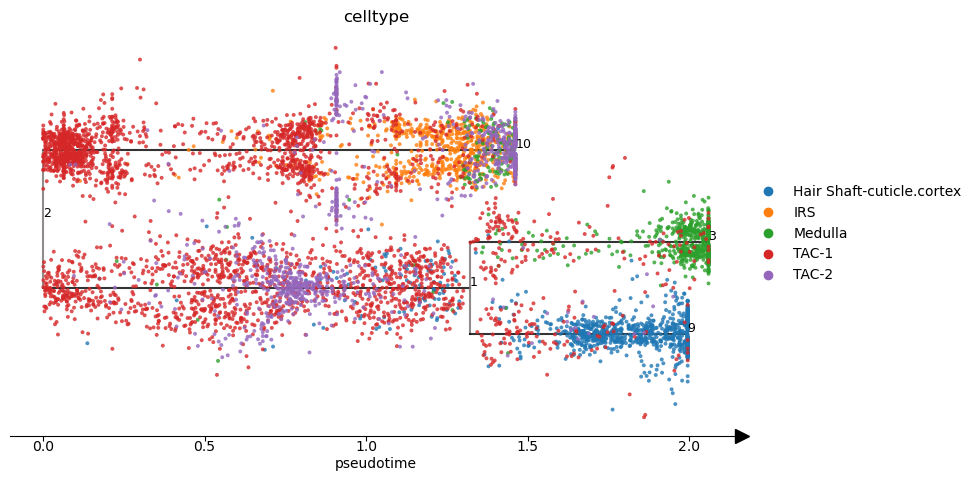

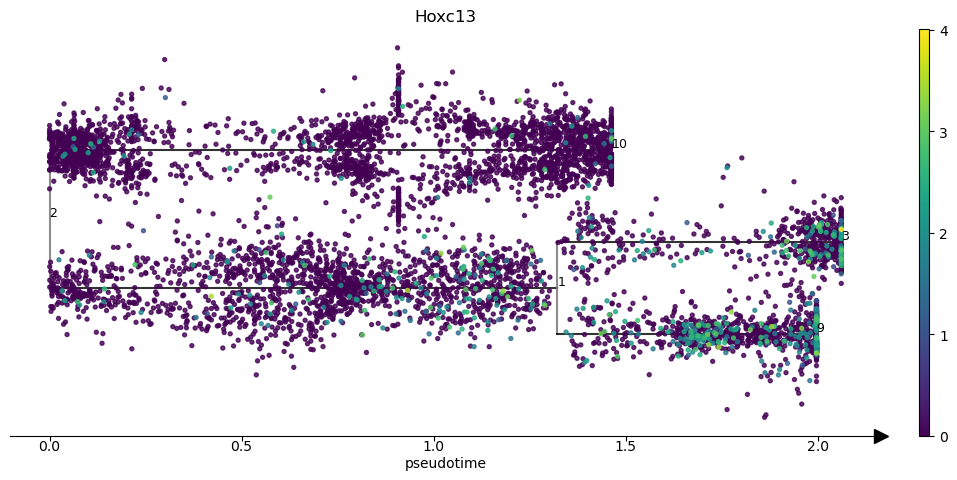

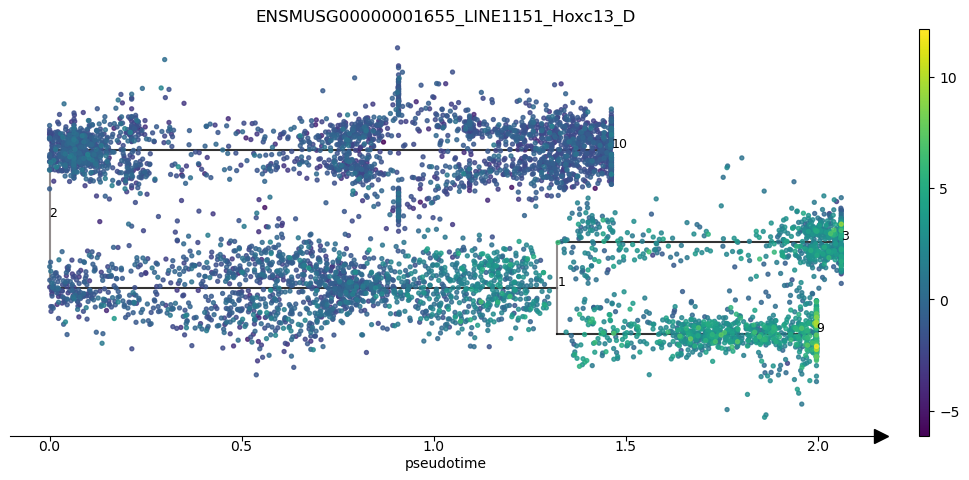

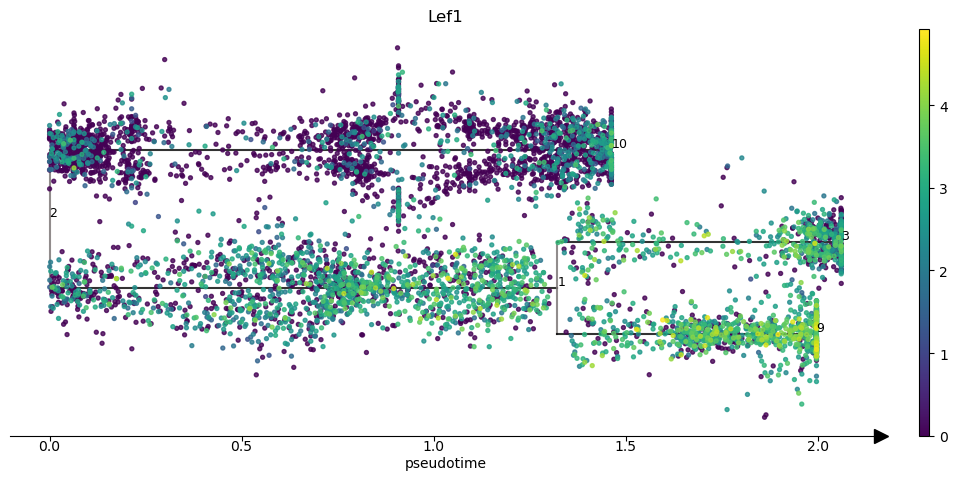

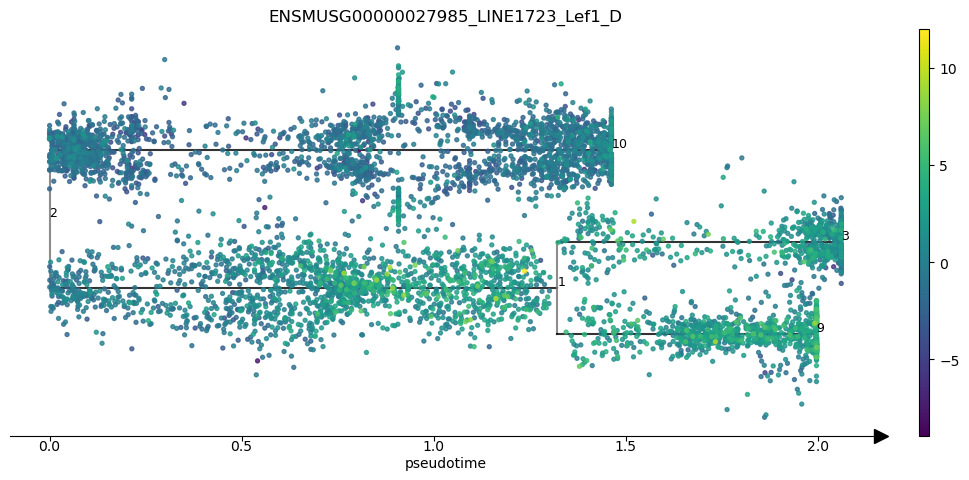

In [7]:
mdata_motif._uns=mdata_motif.uns
st2.pl.stream_sc(mdata_motif,source=source,color=['celltype'],fig_size=(10,5))
st2.pl.stream(mdata_motif,source=source,factor_num_win=10,factor_min_win=5,color=['celltype'],fig_size=(10,5),
             fig_path='figures/shareseq/shareseq_stream_celltypes',save_fig=True)
st2.pl.stream(mdata_motif,source=source,factor_num_win=10,factor_min_win=5,color=['epg_pseudotime'],fig_size=(10,5),
             fig_path='figures/shareseq/shareseq_stream_pseudotime',save_fig=True)

st2.pl.stream(mdata_motif,source=source,factor_num_win=10,factor_min_win=5,color=['celltype'],fig_size=(10,5),
             fig_path='figures/shareseq/shareseq_stream_celltypes',save_fig=True,fig_format='pdf')
st2.pl.stream(mdata_motif,source=source,factor_num_win=10,factor_min_win=5,color=['epg_pseudotime'],fig_size=(10,5),
             fig_path='figures/shareseq/shareseq_stream_pseudotime',save_fig=True,fig_format='pdf')

for plot_var in ['Hoxc13','Lef1']:
    for k in mdata_motif.mod.keys():
        mdata_motif[k].uns=mdata_motif.uns
        for c in mdata_motif.obs.columns:
            if 'epg' in c: mdata_motif[k].obs[c]=mdata_motif.obs[c]

    st2.pl.stream_sc(mdata_motif['rna'],source=source,color=[plot_var],fig_size=(10,5))
    st2.pl.stream(mdata_motif['rna'],source=source,color=[plot_var],fig_size=(10,5),
                 fig_path=f'figures/shareseq/shareseq_stream_{plot_var}',save_fig=True)
    st2.pl.stream(mdata_motif['rna'],source=source,color=[plot_var],fig_size=(10,5),
                 fig_path=f'figures/shareseq/shareseq_stream_{plot_var}',save_fig=True,fig_format='pdf')

    plot_motifs = [var for var in mdata['motif'].var_names if plot_var in var]
    if len(plot_motifs):
        st2.pl.stream_sc(mdata_motif['motif'],source=source,color=plot_motifs,fig_size=(10,5))  
        st2.pl.stream(mdata_motif['motif'],source=source,color=plot_motifs,fig_size=(10,5),
                     fig_path=f'figures/shareseq/shareseq_stream_{plot_motifs}',save_fig=True)
        st2.pl.stream(mdata_motif['motif'],source=source,color=plot_motifs,fig_size=(10,5),
                     fig_path=f'figures/shareseq/shareseq_stream_{plot_motifs}',save_fig=True,fig_format='pdf')

2924 Cells are selected for Path_Source_Nodes-to-include_Target :  Path_2-None-9
Filtering out markers that are expressed in less than 0 cells ...
540 markers are being scanned ...
2924 Cells are selected for Path_Source_Nodes-to-include_Target :  Path_2-None-9
Filtering out markers that are expressed in less than 0 cells ...
Matrix contains negative values...
545 markers are being scanned ...


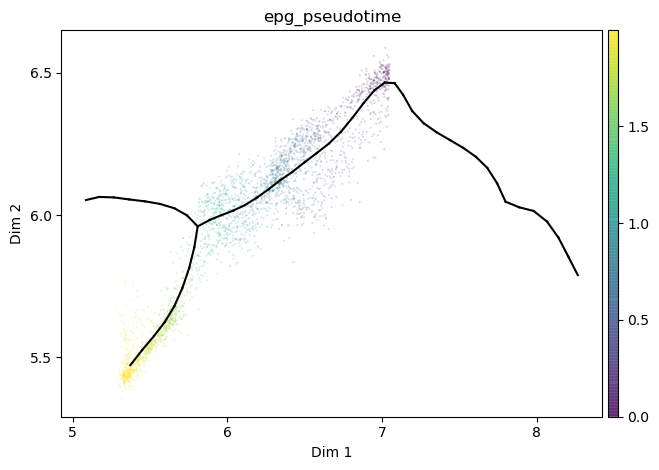

In [9]:
st2.tl.infer_pseudotime(mdata_motif,source=source,target=target)
st2.pl.graph(mdata_motif,color=['epg_pseudotime'],size=.1,alpha=.3)

transition_markers = {}
for assay,a in mdata_motif.mod.items():
    if assay != 'atac':
        a.uns=mdata_motif.uns
        a.obsm=mdata_motif.obsm
        if 'epg_node_id' not in a.obs:
            a.obs=a.obs.join(mdata.obs[[k for k in mdata_motif.obs if 'epg' in k]])
        st2.tl.infer_pseudotime(a,source=source,target=target)
        st2.tl.detect_transition_markers(a,fc_cutoff=0.,min_num_cells=0,method='spearman')
    
        transition_markers[assay] = a.uns['transition_markers'][f'Path_{source}-None-{target}']

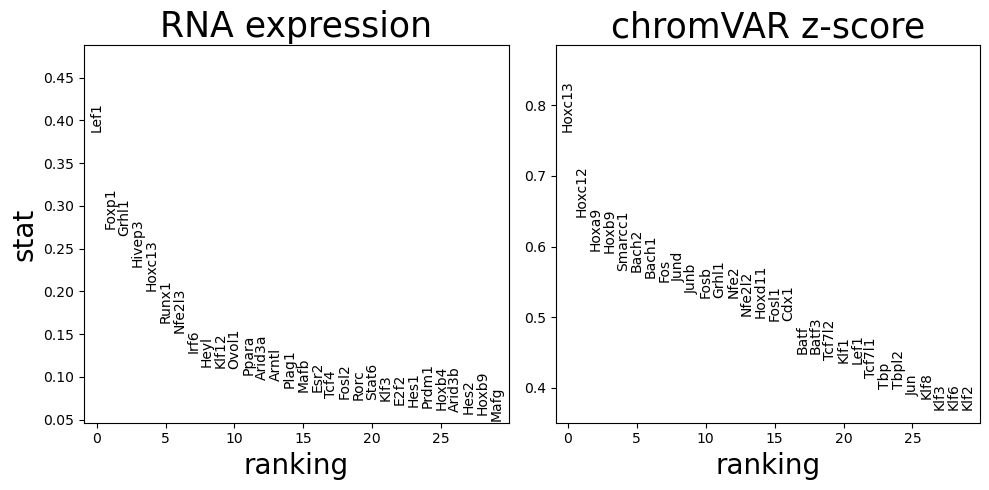

In [10]:
def plot_top_markers(transition_markers,sort_by = 'logfc',n_genes = 25):
    
    f,axs=plt.subplots(1,2,figsize=(10,5),sharex=True)
    axs=axs.flat
    for i,n in zip(range(len(transition_markers)),transition_markers.keys()): 
        
        # get data
        df = transition_markers[n][sort_by].sort_values()[::-1][:n_genes]
        gene_names, scores = df.index, df.values

        if 'motif' in n:
            gene_names= [ l.split('_')[np.where(['LINE' in s for s in l.split('_')])[0][0]+1]  for l in gene_names]
        # plot 
        ymax, ymin = np.max(scores), np.min(scores) - 0.05*np.min(scores)
        ymax += 0.3 * (ymax - ymin)

        ax=next(axs)
        ax.set_ylim(ymin, ymax)
        ax.set_xlim(-0.9, n_genes - 0.1)
        if n=='rna':
            ax.set_title('RNA expression',fontsize=25)
        elif n=='motif':
            ax.set_title('chromVAR z-score',fontsize=25)
        ax.set_xlabel('ranking',fontsize=20)
        if i==0: ax.set_ylabel(sort_by,fontsize=20)

        # Making labels
        for ig, gene_name in enumerate(gene_names):
            ax.text(ig,scores[ig],gene_name,rotation='vertical',verticalalignment='bottom',horizontalalignment='center',fontsize=10,)

    
sort_by = 'stat'
plot_top_markers(transition_markers, sort_by = sort_by,n_genes = 30,)
plt.tight_layout() 
plt.savefig(f'figures/shareseq/shareseq_top_markers_{sort_by}.png',dpi=300,bbox_inches='tight')
plt.savefig(f'figures/shareseq/shareseq_top_markers_{sort_by}.pdf',dpi=300,bbox_inches='tight')

df = pd.concat(transition_markers).reset_index().rename(columns={'level_0':'assay_detailed','level_1':'var_names'})
p=df.hvplot.scatter("stat", "logfc", flip_yaxis=False, logy=False, by='assay_detailed',hover_cols=["var_names"],height=500,width=800)
hvplot.save(p,'figures/shareseq/shareseq_volcano.html')

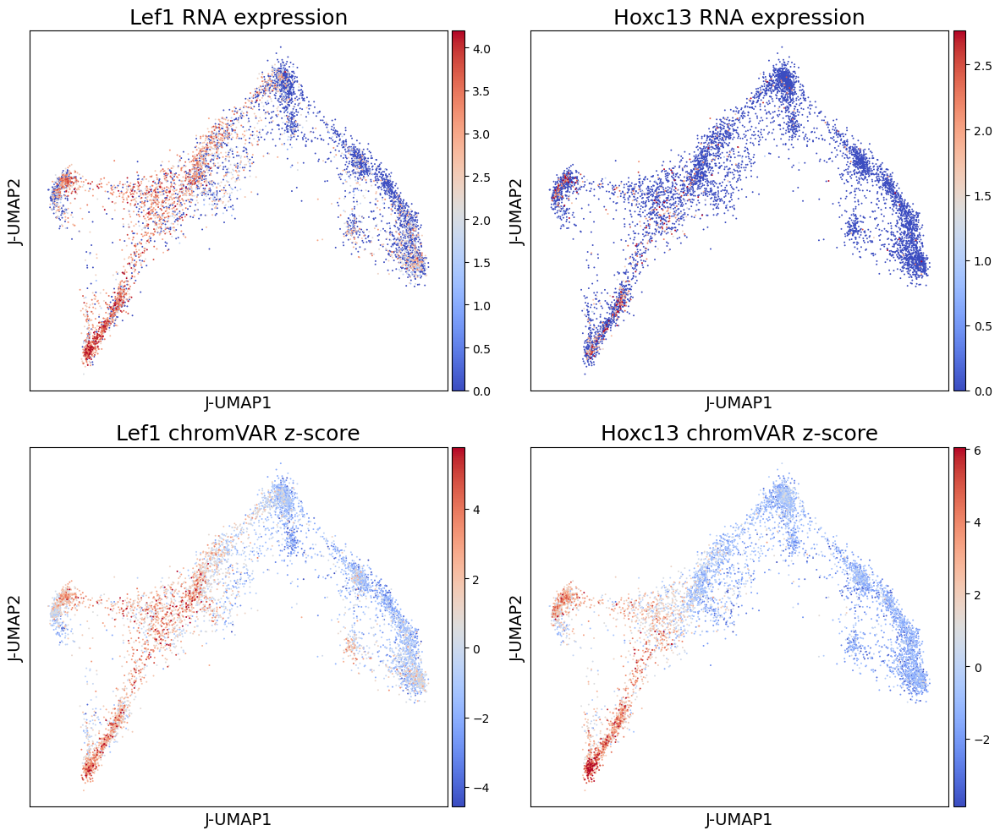

In [11]:
mdata_motif['rna'].obsm['X_dr']=mdata_motif['motif'].obsm['X_dr']=mdata_motif.obsm['X_dr']

f,axs=plt.subplots(2,2,figsize=(12,10),sharex=True,sharey=True)

for i,plot_var in enumerate(['Lef1','Hoxc13']):
    plot_motifs = [var for var in mdata_motif['motif'].var_names if plot_var in var]
    sc.pl.embedding(mdata_motif['rna'],basis='X_dr',color=plot_var,s=8,
                    vmin=np.percentile(mdata['rna'][:,plot_var].X.toarray().flat,1),
                    vmax=np.percentile(mdata['rna'][:,plot_var].X.toarray().flat,99),
                    cmap='coolwarm',ax=axs[0,i],show=0)
    sc.pl.embedding(mdata_motif['motif'],basis='X_dr',color=plot_motifs,s=8,
                    vmin=np.percentile(mdata['motif'][:,plot_motifs].X.toarray().flat,1),
                    vmax=np.percentile(mdata['motif'][:,plot_motifs].X.toarray().flat,99),
                    cmap='coolwarm',ax=axs[1,i],show=0)
    axs[0,i].set_title(plot_var+' RNA expression',fontsize=18)
    axs[1,i].set_title(plot_var+' chromVAR z-score',fontsize=18)
    axs[0,i].set_title(plot_var+' RNA expression',fontsize=18)
    axs[1,i].set_title(plot_var+' chromVAR z-score',fontsize=18)
    axs[0,i].set_xlabel('J-UMAP1',fontsize=14)
    axs[0,i].set_ylabel('J-UMAP2',fontsize=14)   
    axs[1,i].set_xlabel('J-UMAP1',fontsize=14)
    axs[1,i].set_ylabel('J-UMAP2',fontsize=14)   
plt.tight_layout()
plt.savefig('./figures/share_seq_scatter_genes.png',dpi=300,bbox_inches='tight')
plt.savefig('./figures/share_seq_scatter_genes.pdf',dpi=300,bbox_inches='tight')

In [12]:
import gc
import hvplot.pandas
from adjustText import adjust_text

def threshold(x,y,max_n=5):
    for max_factor in np.linspace(1,5):
        idx = (x>=(max(max(x),.5)/max_factor)) & (y>=(max(max(y),.5)/max_factor))
        if sum(idx) > max_n:
            break       
    return idx

def plot_two_assays_static(ax,transition_markers,mod1, mod2, gene2motifs,
                    plot_var='stat',col_var='logfc',color='lightgrey',cmap='Viridis',show_cb=True,show_markers=True):
    
    selected_dfs = {k:v for k,v in transition_markers.items() if k in [mod1,mod2]}
    
    if 'motif' in mod2:
        #rename motif to gene
        selected_dfs[mod2]['motif_names']=selected_dfs[mod2].index
        selected_dfs[mod2]=selected_dfs[mod2].rename(gene2motifs.reset_index().set_index(0)['index'])
        #subset common vars
        selected_dfs[mod2]=selected_dfs[mod2].loc[ selected_dfs[mod2].index.isin(selected_dfs[mod1].index) ]
        selected_dfs[mod1]=selected_dfs[mod1].loc[selected_dfs[mod2].index]
        #rename to motif var names to avoid confusion with duplicates
        motif_gene = []
        for l in selected_dfs[mod2]['motif_names'].str.split('_'):
            #extract entry after LINE+number
            motif_gene.append(l[np.where(['LINE' in s for s in l])[0][0]+1])
        motif_gene = np.array(motif_gene)
        selected_dfs[mod1].index = selected_dfs[mod2].index = motif_gene

    
    df = pd.concat(selected_dfs,axis=1,keys=[mod1,mod2]).dropna()
    df.columns = df.columns.to_flat_index().map(lambda s:' '.join(s))
    
    if type(color)!=str: 
        df = df.join(color)
        color, clabel = df[color.name], color.name
    else:
        clabel = color
              
    x,y = df[f'{mod1} {plot_var}'],df[f'{mod2} {plot_var}']
    ix11,ix00,ix10,ix01 = threshold(x,y), threshold(-x,-y), threshold(x,-y), threshold(-x,y)
    selected = ix11|ix00|ix10|ix01
    
    _ = ax.scatter(df[f'{mod1} {plot_var}'],df[f'{mod2} {plot_var}'],
                   c=df[f'{mod1} {col_var}'],
                   s=40*df[f'{mod2} {col_var}'],alpha=.4)
    #ax.set_xlim(-1.05,1.05)
    #ax.set_ylim(-1.05,1.05)
    
    if show_markers:
        lgd=ax.legend(*_.legend_elements("sizes", num=5),prop={'size':'large'},loc='center', bbox_to_anchor=(1.1, .5),labelspacing=2,borderpad=0,handletextpad=0)
        for t in lgd.get_texts():
            t.set_text(round(int(t.get_text().split('{')[1][:-2])/40,1))
        plt.text(x=.63,y=-.32,s='chromVAR z-score logFC',fontsize=15,rotation=90)
    if show_cb:
        cax = f.add_axes([ax.get_position().x0, ax.get_position().y1 +.005, ax.get_position().width,0.02])
        cb=plt.colorbar(_,cax=cax,orientation="horizontal")
        cb.ax.xaxis.set_ticks_position('top')
        cb.ax.set_title('RNA expression logFC',fontsize=15)
        
    # Making labels
    texts = []
    for idx in np.where(selected)[0]:
        texts.append(ax.text(
            df[f'{mod1} {plot_var}'][idx],
            df[f'{mod2} {plot_var}'][idx],
            df.index[idx],
            rotation='horizontal',
            verticalalignment='bottom',
            horizontalalignment='center',
            fontsize=10,))
        
    adjust_text(texts,arrowprops=dict(arrowstyle="-", color="k", lw=0.5),ax=ax,precision=.05,lim=100)
    

def plot_two_assays(transition_markers,mod1, mod2, gene2motifs, plot_var='stat',color='dodgerblue',cmap='Viridis',
                   xlim=(-1.05,1.05),ylim=(-1.05,1.05)):
    
    selected_dfs = {k:v for k,v in transition_markers.items() if k in [mod1,mod2]}
    
    if 'motif' in mod2:
        #rename motif to gene
        selected_dfs[mod2]['motif_names']=selected_dfs[mod2].index
        selected_dfs[mod2]=selected_dfs[mod2].rename(gene2motifs.reset_index().set_index(0)['index'])
        #subset common vars
        selected_dfs[mod2]=selected_dfs[mod2].loc[ selected_dfs[mod2].index.isin(selected_dfs[mod1].index) ]
        selected_dfs[mod1]=selected_dfs[mod1].loc[selected_dfs[mod2].index]
        #rename to motif var names to avoid confusion with duplicates
        motif_gene = []
        for l in selected_dfs[mod2]['motif_names'].str.split('_'):
            #extract entry after LINE+number
            motif_gene.append(l[np.where(['LINE' in s for s in l])[0][0]+1])
        motif_gene = np.array(motif_gene)
        selected_dfs[mod1].index = selected_dfs[mod2].index = motif_gene  #selected_dfs[mod2]['motif_names']
    
    df = pd.concat(selected_dfs,axis=1,keys=[mod1,mod2]).dropna()
    df.columns = df.columns.to_flat_index().map(lambda s:' '.join(s))
    
    if type(color)!=str: 
        df = df.join(color)
        color, clabel = df[color.name], color.name
    else:
        clabel = color
        
    df.index.name='var_name'
    clip = lambda x,min_,max_: np.clip(x,np.percentile(x,min_),np.percentile(x,max_))
    df[f'{mod1} {color}']=clip(df[f'{mod1} {color}'],5,95)
    df[f'{mod2} {color}']=clip(df[f'{mod2} {color}'],5,95)
    df[f'{mod2} {color}']*=40
    df[f'{mod2} {color}']+=5
    return df,df.hvplot.scatter(f'{mod1} {plot_var}',f'{mod2} {plot_var}', hover_cols=["var_name"],
                             color=f'{mod1} {clabel}',size=f'{mod2} {clabel}',cmap=cmap,clabel=f'{mod1} {clabel}', hover=True,
                             xlim=xlim,ylim=ylim,height=800,width=800,shared_axes=False)

def compose_fig(plots,ncols=2):
    figure = '('+ '+'.join([f'plots[{i}]' for i in range(len(plots))]) + f').cols({ncols})'
    return eval(figure)

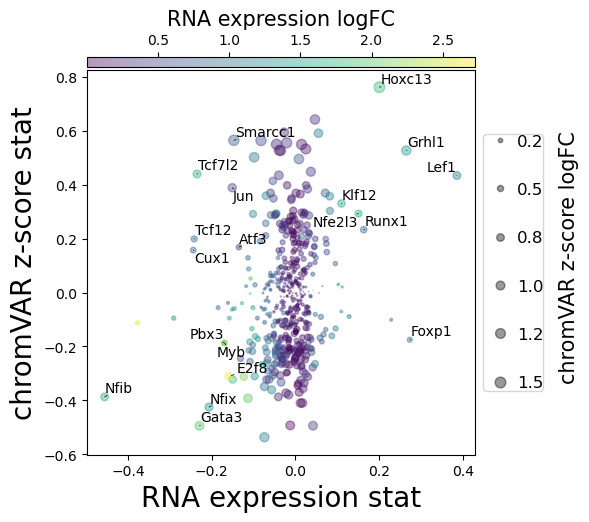

In [13]:
modalities = list(mdata_motif.mod.keys())
modalities = ['rna','motif']

f=plt.figure(figsize=(5,5))
ax=plt.subplot()

plots = []
#correlations = {}
for i in range(len(modalities)):
    for j in range(i+1,len(modalities)):
        #comparing to motifs
        #if 'motifs' in modalities[i]:
        #    df_interp_genes, df_interp_motifs,_ = get_plot_df()
        #    del df_interp_genes['xs'], df_interp_motifs['xs']
            #correlations[modalities[i],modalities[j]] = pd.Series(st2.tl.spearman_columns(df_interp_motifs.to_numpy(),df_interp_genes.to_numpy()),index=df_interp_motifs.columns)
        #else:   
        #    correlations[modalities[i],modalities[j]] = st2.tl.spearman_columns(interpolated[modalities[i]],interpolated[modalities[j]])
        #color = correlations[modalities[i],modalities[j]].rename('correlation '+modalities[i]+' vs '+modalities[j])
        
        plot_two_assays_static(ax,transition_markers,modalities[i],modalities[j],show_cb=True,show_markers=True,
                                      gene2motifs=gene2motifs, plot_var='stat',color='logfc')
        #df.to_csv(save_name[:-5]+'.csv')
        
ax.set_ylabel('chromVAR z-score stat',fontsize=20)
ax.set_xlabel('RNA expression stat',fontsize=20)
plt.savefig('figures/shareseq/shareseq_X_plot.png',dpi=300,bbox_inches='tight')
plt.savefig('figures/shareseq/shareseq_X_plot.pdf',dpi=300,bbox_inches='tight')

In [17]:
modalities = list(mdata_motif.mod.keys())

plots = []
#correlations = {}
for i in range(len(modalities)):
    for j in range(i+1,len(modalities)):
        #comparing to motifs
        #if 'motifs' in modalities[i]:
        #    df_interp_genes, df_interp_motifs,_ = get_plot_df()
        #    del df_interp_genes['xs'], df_interp_motifs['xs']
            #correlations[modalities[i],modalities[j]] = pd.Series(st2.tl.spearman_columns(df_interp_motifs.to_numpy(),df_interp_genes.to_numpy()),index=df_interp_motifs.columns)
        #else:   
        #    correlations[modalities[i],modalities[j]] = st2.tl.spearman_columns(interpolated[modalities[i]],interpolated[modalities[j]])
        #color = correlations[modalities[i],modalities[j]].rename('correlation '+modalities[i]+' vs '+modalities[j])
        
        df,plot=plot_two_assays(transition_markers,modalities[i],modalities[j],xlim=None,ylim=None,
                                      gene2motifs=gene2motifs, plot_var='stat',color='logfc')
        plots.append(plot)
        #df.to_csv(save_name[:-5]+'.csv')

hvplot.save(plots[0], 'figures/shareseq/shareseq_X_plots.html')
plots[0]

:Scatter   [rna stat]   (motif stat,rna logfc,motif logfc,var_name)

# Old

In [ ]:
#import batchglm.api as glm
#import diffxpy.api as de
#mdata_motif_branch = mdata_motif['rna'][~mdata_motif['rna'].obs['epg_pseudotime'].isna()].copy()
#det = de.test.continuous_1d(
#    data=mdata_motif_branch.X.toarray(),
#    sample_description=mdata_motif_branch.obs,
#    gene_names=mdata_motif_branch.var_names,
#    formula_loc="~ 1 + epg_pseudotime",
#    formula_scale="~ 1",
#    factor_loc_totest="epg_pseudotime",
#    continuous="epg_pseudotime",
#    size_factors=np.random.uniform(0.2, 2, mdata_motif_branch.n_obs),
#    df=4,
#    quick_scale=False
#)
#det_res = det.summary()
#
#import seaborn as sns
#det.plot_ma()
#for x in ['epg_pseudotime0', 'epg_pseudotime1', 'epg_pseudotime2', 'epg_pseudotime3']:
#    sns.lineplot(x=mdata_motif_branch.obs["epg_pseudotime"].values, y=mdata_motif_branch.obs[x].values)
#det.plot_heatmap(
#    genes=mdata_motif_branch.var_names[:20],
#    transform="zscore"
#)
#det.plot_genes(
#    genes=mdata_motif_branch.var_names[:3],
#    log=True
#)

In [ ]:
#mdata['motif'].var['var_names_prefix']=mdata['motif'].var_names.map(lambda s: ''.join(s.split('.')[0:2]))
#mdata['motif'].var['var_names_suffix']=mdata['motif'].var_names.map(lambda s: s.split('.')[-1])
#mdata['motif'].var['var_names_isfusion']=mdata['motif'].var['var_names_suffix'].map(lambda s: '::' in s)

In [ ]:
#import sklearn
#for assay,adata in mdata.mod.items():
#    if assay !='atac':
#        if 'X_smooth' not in adata.obsm:
#            dist,idx = sklearn.neighbors.NearestNeighbors(n_jobs=8).fit(np.asarray(adata.X)).kneighbors()
#            adata.obsm['X_smooth'] = np.asarray(adata.X)[idx].mean(1)
#        
#source, target = 13, 4

#st2.tl.infer_pseudotime(mdata,source=source,target=target)

#mdata._uns=mdata.uns
#st2.pl.stream_sc(mdata,source=source,color=['celltype'],fig_size=(10,5))
#st2.pl.stream(mdata,source=source,factor_num_win=10,factor_min_win=5,color=['celltype'],fig_size=(10,5))
#st2.pl.stream(mdata,source=source,factor_num_win=10,factor_min_win=5,color=['epg_pseudotime'],fig_size=(10,5))

#transition_markers_smooth = {}
#for assay,adata in mdata.mod.items():
#    if assay != 'atac':
#        X_tmp = adata.X.copy()
#        adata.X = adata.obsm['X_smooth']
#        st2.tl.infer_pseudotime(adata,source=source,target=target)
#        st2.tl.detect_transition_markers(adata,fc_cutoff=0., method='spearman')
#        adata.X = X_tmp

#        transition_markers_smooth[assay] = adata.uns['transition_markers'][f'Path_{source}-None-{target}']

Plot results

In [ ]:
#p=df.hvplot.scatter("stat", "logfc", flip_yaxis=False, logy=False, 
#                    by='assay_detailed',hover_cols=["var_names"],height=500,width=800)
#hvplot.show(p)

Let's check some of those markers found in several assays

In [ ]:
#def scatterplot_assays(plot_var):
#    f,axs=plt.subplots(1,3,figsize=(15,5),sharex=True)
#    axs=axs.flat
#    for assay,adata in mdata.mod.items():
#        if assay=='atac':
#            continue
#        ax=next(axs)
#        adata.obsm=mdata.obsm
#        if assay =='motif':
#            sc.pl.embedding(adata,'X_dr',color=adata.var_names[adata.var['var_names_suffix']==plot_var],
#                            vmax=np.percentile(adata[:,adata.var_names[adata.var['var_names_suffix']==plot_var]].X,99),
#                            ax=ax,show=False)
#        else:
#            sc.pl.embedding(adata,'X_dr',color=plot_var,vmax=np.percentile(adata[:,plot_var].X.toarray(),99),
#                            ax=ax,show=False)
#        ax.set_title(assay)
#    plt.show()
#
#scatterplot_assays('Lef1')

In [ ]:
mdata['motif'].var[['symbol1','symbol2']] = mdata['motif'].var['var_names_suffix'].str.split('::',expand=True)

idx_fusion = mdata['motif'].var_names.str.contains('::')
not_fusion = mdata['motif'].var_names[~idx_fusion]
fusion = mdata['motif'].var_names[idx_fusion]
idx_motifs = np.concatenate((not_fusion,np.repeat(fusion,2)))
idx_genes = np.concatenate((not_fusion.map(lambda s: s.split('.')[-1]),
                           np.array(mdata['motif'].var.loc[fusion,['symbol1','symbol2']]).flatten('C')))

# remove missing genes
idx_motifs=idx_motifs[np.isin(pd.Series(idx_genes).str.upper(),mdata['rna'].var_names.str.upper())]
idx_genes=idx_genes[np.isin(pd.Series(idx_genes).str.upper(),mdata['rna'].var_names.str.upper())]   

In [ ]:
def plot_two_assays(transition_markers,mod1, mod2, idx_motifs=None,idx_genes=None,
                    plot_var='stat',color='dodgerblue',cmap='Viridis',
                   xlim=(-1.05,1.05),ylim=(-1.05,1.05)):

    selected_dfs = {k:v for k,v in transition_markers.items() if k in [mod1,mod2]}
    
    if 'motif' in mod2:
        df = get_df_same_names(selected_dfs,mod2,mod1)
    elif 'motif' in mod1:
        df = get_df_same_names(selected_dfs,mod1,mod2)
    else:
        df = pd.concat(selected_dfs,axis=1,keys=[mod1,mod2]).dropna()
    df.columns = df.columns.to_flat_index().map(lambda s:' '.join(s))

    if type(color)!=str: 
        df = df.join(color)
        color, clabel = df[color.name], color.name
    else:
        clabel = color
        
    df.index.name='var_name'
    clip = lambda x,min_,max_: np.clip(x,np.percentile(x,min_),np.percentile(x,max_))
    df[f'{mod1} {color}']=clip(df[f'{mod1} {color}'],5,95)
    df[f'{mod2} {color}']=clip(df[f'{mod2} {color}'],5,95)
    df[f'{mod2} {color}']*=40
    df[f'{mod2} {color}']+=5
    return df,df.hvplot.scatter(f'{mod1} {plot_var}',f'{mod2} {plot_var}', hover_cols=["var_name"],
                             color=f'{mod1} {clabel}',size=f'{mod2} {clabel}',cmap=cmap,clabel=f'{mod1} {clabel}', hover=True,
                             xlim=xlim,ylim=ylim,height=800,width=800,shared_axes=False)

def compose_fig(plots,ncols=2):
    figure = '('+ '+'.join([f'plots[{i}]' for i in range(len(plots))]) + f').cols({ncols})'
    return eval(figure)

def get_df_same_names(selected_dfs,mod_motif,mod_rna):
    df_motif = selected_dfs[mod_motif]
    df_rna = selected_dfs[mod_rna]
    
    idx_motifs2=idx_motifs[np.isin(idx_genes,df_rna.index)]
    idx_genes2=idx_genes[np.isin(idx_genes,df_rna.index)]
    df_motif = df_motif.loc[idx_motifs2]
    df_rna = df_rna.loc[idx_genes2]

    df_motif.index = df_rna.index = df_motif.index.str.cat(df_rna.index,sep='_')
    
    df = pd.concat((df_motif,df_rna),axis=1,keys=[mod_motif,mod_rna]).dropna()
    #df.columns = df.columns.to_flat_index().map(lambda s:' '.join(s))
    return df

In [ ]:
plots = []
for i in range(len(modalities)-1):
    for j in range(i+1,len(modalities)):
        #comparing to motifs
        print(modalities[i],modalities[j])
        df,plot=plot_two_assays(transition_markers,modalities[i],modalities[j],xlim=None,ylim=None,
                                      idx_motifs=idx_motifs,idx_genes=idx_genes, plot_var='stat',color='logfc')
        plots.append(plot)
        #df.to_csv(save_name[:-5]+'.csv')

hvplot.save(compose_fig(plots,3), 'test.html')
#with open(save_name[:-5]+'_transition_markers.pkl','wb') as f:
#    pickle.dump(transition_markers,f)

        
    #df_interp_genes, df_interp_motifs,df_data = get_plot_df(subsample=True)
    #df_data.to_csv(save_name[:-5]+'_data.csv')
    #df_data.to_csv('../../../git/stream_share/assets/'+(save_name[:-5]+'_data.csv')[10:])

In [ ]:
%load_ext rpy2.ipython

In [ ]:
%%R
#remotes::install_github("anna-neufeld/countsplit")
remotes::install_github("anna-neufeld/countsplit.tutorials")

In [ ]:
import numpy as np
from scipy.sparse import issparse
from scipy.stats import beta, binom

def countsplit(X, epsilon=0.5, folds=2):
    if epsilon <= 0 or epsilon >= 1:
        raise ValueError('Parameter epsilon must be in (0,1)')
    if folds != 2:
        raise ValueError("Splitting with more than two folds is coming soon.")

    if issparse(X):
        Xtrain = X.copy()
        non_zero_idx = Xtrain.nonzero()
        non_zero_vals = Xtrain[non_zero_idx]
        non_zero_sampled = binom.rvs(n=non_zero_vals, p=epsilon)
        Xtrain[non_zero_idx] = non_zero_sampled
        Xtest = X - Xtrain
    else:
        Xtrain = np.apply_along_axis(lambda u: binom.rvs(n=u, p=epsilon), 0, X)
        Xtest = X - Xtrain
    return {'train': Xtrain, 'test': Xtest}

def betaBinSample(x, b, eps):
    p = beta.rvs(eps*b, (1-eps)*b, size=len(x))
    return binom.rvs(n=x, p=p)

def nb_countsplit(X, epsilon=0.5, overdisps=None, folds=2):
    if epsilon <= 0 or epsilon >= 1:
        raise ValueError('Parameter epsilon must be in (0,1)')
    if folds != 2:
        raise ValueError("Splitting with more than two folds is coming soon.")

    if overdisps is None:
        return countsplit(X, epsilon)

    if issparse(X):
        Xtrain = X.copy()
        non_zero_idx = Xtrain.nonzero()
        non_zero_vals = Xtrain[non_zero_idx]
        mapped_overdisps = overdisps[non_zero_idx[1]]
        non_zero_sampled = betaBinSample(non_zero_vals, mapped_overdisps, epsilon)
        Xtrain[non_zero_idx] = non_zero_sampled
        Xtrain.eliminate_zeros()
        Xtest = X - Xtrain
        Xtest.eliminate_zeros()
    else:
        Xtrain = np.apply_along_axis(lambda u: betaBinSample(u, overdisps, epsilon), 0, X)
        Xtest = X - Xtrain
    return {'train': Xtrain, 'test': Xtest}